# Practice III Machine Learning
# <font color='Red'>Understanding how restaurants are rated and Predicting their status using Natural Language Processing (NLP)</font>
## `Masters Degree in Data Science`
# <font color='orange'>CUNEF</font>
## By Gabriela Gutiérrez-Colomer Santos: g.gutierrezcolomer@cunef.edu
### The ojecive of the following practice is to understand how restaurants are rated and how the reviews and the words used affect their rating using the `Yelp` dataset. In this practice we will only use 2 datasets: `yelp_academic-dataset_business.json` and `yelp_academic_dataset_reviews.json` . 

#### Notebook I, EDA

![YELP](../images/yelp.jpeg)

# Index
<ol style="font-size:18px; font-family: Arial">
  <li>Upload the business dataset.</li>
    <span style="color: red">Uploading the dataset to perform cleaning of the business.</span>
  <li>Define the problem.</li>
    <span style="color: red">We will focus only on business that are type restaurants or offer a similar service, pharmacies, groccery stores and supermarkets will be ignored.</span>
  <li>Studying the most reviewed USA state.</li>
    <span style="color: red">The state of Pennsylvania is the state with more reviews so we will be using it for the whole practice.</span>
  <li>Reviewing the restaurants.</li>
    <span style="color: red">We will study the best restaurants in Pennsylvania by looking at a very helpful feature called ``senti_polarity``.</span>
  <li>Reviewing the restaurants by type of food.</li>
    <span style="color: red">We will review the words used for the best restaurants in Pennsylvania but filtering by type of food.</span>
  <li>Restaurant Recomendation System.</li>
    <span style="color: red">Develop a restaurant filter to be able to access the restaurants in an easier way.</span>
</ol>


In [1]:
%%capture
%run -i temp.py

## Starting with some context, What is NLP?
**Natural Language Processing** (NLP) is a subfield of artificial intelligence that deals with the interaction between computers and humans through the use of **natural language**. It aims to enable computers to understand, interpret, and generate human language in order to facilitate communication and interaction with humans.

One application of NLP is in the analysis of restaurant reviews. Customer reviews are an **important source of information for businesses**, as they can provide insight into customer satisfaction and identify areas for improvement. However, manually reading and interpreting large amounts of text can be time-consuming and error-prone. **This is where NLP comes in**.

By using NLP techniques, it is possible to **automatically extract useful information** from restaurant reviews and analyze it in a structured and meaningful way. For example, NLP can be used to **identify the overall sentiment** expressed in a review (e.g. positive, negative, neutral) and specific aspects of the restaurant that are mentioned (e.g. food, service, ambiance). **This can help businesses understand what customers like and dislike** about their establishment, and make informed decisions about how to improve their service.

In addition to sentiment analysis, NLP can also be used for a variety of other tasks related to restaurant reviews. For example, it can be used to classify reviews into different categories (e.g. food, service, ambiance), to identify common themes or trends in the reviews, or to generate summary statistics or visualizations of the data.

Overall, NLP is a powerful tool for understanding and making sense of large amounts of text data, such as restaurant reviews. It can save businesses time and effort by automating the process of analyzing and interpreting customer feedback, and provide valuable insights into customer satisfaction and areas for improvement.

## 1. Upload the business dataset 
The first step is to load the business database in order to be able to identify the type of business to be exploited. There are fashion businesses, restaurants, pharmacies etc. 

In [2]:
business_json_path = '../data/raw/yelp_academic_dataset_business.json'
df_business = pd.read_json(business_json_path, lines=True)
df_business.head(5)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


In [3]:
df_business.shape[0]
#with shape 0 we observe the number of rows found. 

150346

We can see that there are several shops that are closed (they are not going to be reopen at any time). Let's remove them from the dataset. It must be understood that closed businesses will not provide any important information. 

In [4]:
op = df_business.groupby('is_open').business_id.count()
op

is_open
0     30648
1    119698
Name: business_id, dtype: int64

In [5]:
df_business['is_open'] = df_business['is_open'].apply(str)
fig = px.histogram(df_business, x="is_open")
fig.show()

In [6]:
#we want only. those businesses that are still open
df_business['is_open'] = df_business['is_open'].apply(int)
df_business.drop(df_business[df_business.is_open == 0].index, inplace=True)

The hours are not organised in an orderly fashion. We should assign the hours where the restaurants are open to each day; this way we will know when and from what time to what time the businesses open and close. 

In [7]:
#lets change the format of the hours.
#this feature could be important for the future predictions
business_hours = df_business['hours'].apply(pd.Series)
business_hours.to_json('business_hours.json')
business_hours

,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
1,0:0-0:0,8:0-18:30,8:0-18:30,8:0-18:30,8:0-18:30,8:0-14:0,NaN
3,7:0-20:0,7:0-20:0,7:0-20:0,7:0-20:0,7:0-21:0,7:0-21:0,7:0-21:0
4,NaN,NaN,14:0-22:0,16:0-22:0,12:0-22:0,12:0-22:0,12:0-18:0
5,0:0-0:0,6:0-22:0,6:0-22:0,6:0-22:0,9:0-0:0,9:0-22:0,8:0-22:0
6,0:0-0:0,10:0-18:0,10:0-18:0,10:0-18:0,10:0-18:0,10:0-18:0,12:0-18:0
...,...,...,...,...,...,...,...
150341,10:0-19:30,10:0-19:30,10:0-19:30,10:0-19:30,10:0-19:30,10:0-17:30,11:0-17:0
150342,9:30-17:30,9:30-17:30,9:30-17:30,9:30-17:30,9:30-17:30,9:0-17:0,0:0-16:0
150343,NaN,NaN,NaN,NaN,NaN,NaN,NaN
150344,9:0-20:0,9:0-20:0,9:0-20:0,9:0-20:0,9:0-20:0,9:0-17:0,10:0-17:0


The attributes column appears to have essential information on what each trade does. It is in a very awkward format. To improve the structure I have decided to create a column for each attribute. We drop those that appear not to be related to restaurants. The words written in the attributes column are now new columns of the dataset. 

In [8]:
#if we look closely to the attributes column, it seems to be important because it gives us additional info about the 
#businesess
#lets drop those attributes that are not relvant to the case itself such as: 
#BikeParking, #BusinessParking,HairSpecializesIn 
business_attribute = df_business['attributes'].apply(pd.Series)

business_attribute.drop('BikeParking', axis = 1, inplace = True)
business_attribute.drop('BusinessParking', axis = 1, inplace = True)
business_attribute.drop('HairSpecializesIn', axis = 1, inplace = True)
business_attribute.columns
#we keep only the features related to restaurants

Index(['BusinessAcceptsCreditCards', 'RestaurantsDelivery', 'OutdoorSeating',
       'RestaurantsPriceRange2', 'RestaurantsTakeOut', 'ByAppointmentOnly',
       'WiFi', 'Alcohol', 'Caters', 'WheelchairAccessible', 'GoodForKids',
       'RestaurantsAttire', 'RestaurantsReservations', 'Ambience', 'CoatCheck',
       'DogsAllowed', 'RestaurantsTableService', 'RestaurantsGoodForGroups',
       'HasTV', 'HappyHour', 'DriveThru', 'GoodForMeal', 'NoiseLevel',
       'BusinessAcceptsBitcoin', 'AcceptsInsurance', 'Smoking', 'Music',
       'GoodForDancing', 'BestNights', 'BYOB', 'Corkage', 'BYOBCorkage',
       'Open24Hours', 'RestaurantsCounterService', 'AgesAllowed',
       'DietaryRestrictions'],
      dtype='object')

In [9]:
hours_attrib_business = pd.concat([business_attribute, business_hours], axis = 1)

In [10]:
df_business_clean = pd.concat([hours_attrib_business, df_business], axis = 1)

## 2. Define the problem
For the practice I decided to keep those businesses that are restaurants. Grocery stores, pharmacies or food shops will not be included. 

In [11]:
df_business_clean.drop('attributes', axis = 1, inplace = True)
df_business_clean.drop('hours', axis = 1, inplace = True)
#we drop those 2 columns because we already transformed them. 

We can see that the column categories also has a lot of information. It tell us characteristics about each business.

In [12]:
#categories give also a lot of information
df_business_clean.categories

1         Shipping Centers, Local Services, Notaries, Ma...
3         Restaurants, Food, Bubble Tea, Coffee & Tea, B...
4                                 Brewpubs, Breweries, Food
5         Burgers, Fast Food, Sandwiches, Food, Ice Crea...
6         Sporting Goods, Fashion, Shoe Stores, Shopping...
                                ...                        
150341                           Nail Salons, Beauty & Spas
150342    Pets, Nurseries & Gardening, Pet Stores, Hobby...
150343    Shopping, Jewelry, Piercing, Toy Stores, Beaut...
150344    Fitness/Exercise Equipment, Eyewear & Optician...
150345    Beauty & Spas, Permanent Makeup, Piercing, Tattoo
Name: categories, Length: 119698, dtype: object

The text found in categories can only have a maximum of 10 categories, thus we will define 10 new columns for each category we may find in the column. In this way we will have more information about the business. 

In [13]:
#the category column give us a lot of information regarding what type of business we are dealing with
#the problem is they are all stucked up
#we must separate them 
#why 10? 10 is the largest amount of possible categories found in the description
category_split = df_business_clean['categories'].str.split(',', expand=True)[[0,1,2,3,4,5,6,7,8,9]]
#with the str.split we do a separation between words by the ,

# rename the new columns
category_split.columns = ['category_1', 'category_2', 'category_3', 'category_4'
, 'category_5', 'category_6', 'category_7', 'category_8', 'category_9', 'category_10']

#we concat again so we have business description and category
business_category = pd.concat([df_business_clean, category_split], axis=1)

#now drop the actual categories column
business_category = business_category.drop(['categories'], axis=1)

business_category.head()
#we can find actual informtion about the restaurants in all the categories

,BusinessAcceptsCreditCards,RestaurantsDelivery,OutdoorSeating,RestaurantsPriceRange2,RestaurantsTakeOut,ByAppointmentOnly,WiFi,Alcohol,Caters,WheelchairAccessible,...,category_1,category_2,category_3,category_4,category_5,category_6,category_7,category_8,category_9,category_10
1,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,Shipping Centers,Local Services,Notaries,Mailbox Centers,Printing Services,None,None,None,None,None
3,False,False,False,1,True,False,u'free',u'none',True,NaN,...,Restaurants,Food,Bubble Tea,Coffee & Tea,Bakeries,None,None,None,None,None
4,True,NaN,NaN,NaN,True,NaN,NaN,NaN,False,True,...,Brewpubs,Breweries,Food,None,None,None,None,None,None,None
5,True,True,True,1,True,False,u'no',u'none',False,True,...,Burgers,Fast Food,Sandwiches,Food,Ice Cream & Frozen Yogurt,Restaurants,None,None,None,None
6,True,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,...,Sporting Goods,Fashion,Shoe Stores,Shopping,Sports Wear,Accessories,None,None,None,None


Separating categories allow you to filter businesses in a very simple way.  Now we can get the businesses we are interested in. In the case of this practice, I have decided to choose only restaurants. The words related to restaurants that I found are words such as: `Chinese`, `Italian` , `Thai` etc, of course there are more, we must grouped every word in order to obtain all the restaurants in the dataset. 

In [14]:
#we need all the business thatdo have those descriptions in the categories  column. 
# we will take only those business that are food related. 

#asia 
chinese = 'Chinese', ' Chinese'
vietnamese = 'Vietnamese', ' Vietnamese'
pakistani = 'Pakistani', ' Pakistani'
indian = 'Indian',' Indian'
thai = 'Thai', ' Thai'
japanese = 'Japanese', ' Japanese'
italian = 'Italian', ' Italian'

#america both north and south
american_t = 'American (Traditional)', ' American (Traditional)'
american_new = 'American (New)', ' American (New)'
mexican = 'Mexican', 'ica Mexn'
canadian_new = 'Canadian (New)', ' Canadian (New)'

#europe
hungarian = 'Hungarian', ' Hungarian'
german = 'German', ' German'
french = 'French', ' French'
mid_east = 'Middle Eastern', ' Middle Eastern'

business_class = [' Restaurants','Restaurants',' Food','Food' ,
' Pizza', 'Pizza', 'Mexican',' Mexican','American (Traditional)', ' American (Traditional)',
'American (New)', ' American (New)', 'Italian', ' Italian', 'Indian', ' Indian', 'Pakistani',
' Pakistani', 'Thai', ' Thai', 'Japanese', ' Japanese', 'French', ' French', 'Canadian (New)',
' Canadian (New)', 'Middle Eastern', ' Middle Eastern', 'German', ' German', 'Vietnamese',
' Vietnamese', 'Chinese', ' Chinese','Hungarian', ' Hungarian']                                                  

In [15]:
# Python3 program to convert a 
# list into a tuple
def convert(business_class):
    return tuple(i for i in business_class)

Once we found the words that match restaurant characteristics we must filter the dataset and keep only the rows we are interested in.

In [16]:
business_class = convert(business_class)

In [17]:
#filter the words in business class for each category
#with the dataset restaurants we only get the restaurants that yelp_business has.
restaurants = business_category.loc[(business_category['category_1']\
                .isin(business_class)) | (business_category['category_2']\
                .isin(business_class)) | (business_category['category_3']\
                .isin(business_class)) | (business_category['category_4']\
                .isin(business_class)) | (business_category['category_5']\
                .isin(business_class)) | (business_category['category_6']\
                .isin(business_class)) | (business_category['category_7']\
                .isin(business_class)) | (business_category['category_8']\
                .isin(business_class)) | (business_category['category_9']\
                .isin(business_class)) | (business_category['category_10']\
                .isin(business_class))]

## 3. Studying the most reviewed USA state
Let's see which USA state has the higher amount of reviews. We will choose the state with the highest amount of reviews as we will be able to make a proper study of how restaurants are being rated.

In [18]:
fig = px.histogram(restaurants, x="state").update_xaxes(categoryorder = 'total descending')
fig.show()
#this code shows us a histogram with each state and their number of reviews. 

Pennsylvania is the state with the highest number of reviews. To continue with the practice, we will filter only for those restaurants that are located in the state of Pennsylvania. 

In [19]:
pen_restaurants = restaurants.loc[restaurants['state'].isin(['PA'])]
#we keep only the pen restuarants

In [20]:
pen_restaurants.columns

Index(['BusinessAcceptsCreditCards', 'RestaurantsDelivery', 'OutdoorSeating',
       'RestaurantsPriceRange2', 'RestaurantsTakeOut', 'ByAppointmentOnly',
       'WiFi', 'Alcohol', 'Caters', 'WheelchairAccessible', 'GoodForKids',
       'RestaurantsAttire', 'RestaurantsReservations', 'Ambience', 'CoatCheck',
       'DogsAllowed', 'RestaurantsTableService', 'RestaurantsGoodForGroups',
       'HasTV', 'HappyHour', 'DriveThru', 'GoodForMeal', 'NoiseLevel',
       'BusinessAcceptsBitcoin', 'AcceptsInsurance', 'Smoking', 'Music',
       'GoodForDancing', 'BestNights', 'BYOB', 'Corkage', 'BYOBCorkage',
       'Open24Hours', 'RestaurantsCounterService', 'AgesAllowed',
       'DietaryRestrictions', 'Monday', 'Tuesday', 'Wednesday', 'Thursday',
       'Friday', 'Saturday', 'Sunday', 'business_id', 'name', 'address',
       'city', 'state', 'postal_code', 'latitude', 'longitude', 'stars',
       'review_count', 'is_open', 'category_1', 'category_2', 'category_3',
       'category_4', 'category_5'

It seems that we have too many columns in the dataset, some of them are not needed to study the trades. We remove the ones that are not necessary. 

In [21]:
pen_restaurants.drop(pen_restaurants.columns[[1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25
,26,27,28,29,30,31,32,33,34,35]], axis=1, inplace=True)

### Studying the Geography of Pennsylvania. 
In this part of the practice, we will study where the restaurants are located. To do so, we will use the Python library `Geopandas`, which allows us to represent the restaurants in each city. We will start by first understanding where the state of Pennsylvania is in the United States and we will finish with the location of each restaurant in each city. 

In [22]:
states = geopandas.read_file('../data/raw/usa-states-census-2014.shp')
type(states)
#uploading the shp file to be able to represent the map. 

geopandas.geodataframe.GeoDataFrame

In [23]:
northeast = states[states['region'] == 'Northeast']
#the state of penn is located in the Northeast of USA, we will keep only those Northeast states. 

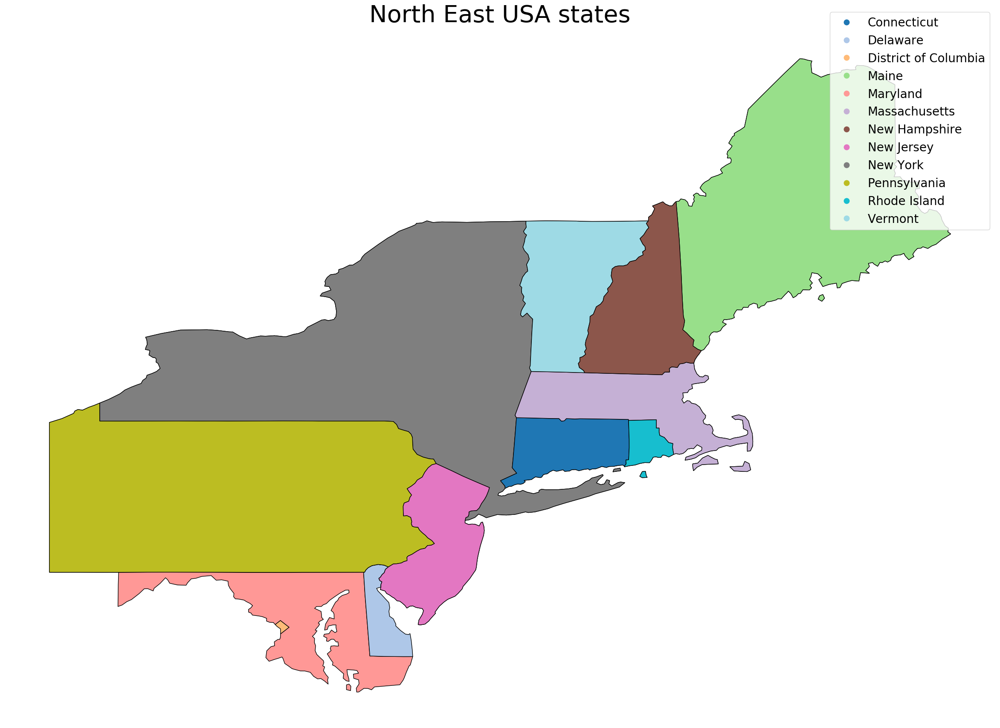

In [24]:
#with this code, we represent the Northeast of USA differentiated by colors. Each color is a state. 
leg_kwds={'loc':'upper right','ncol':1, 'bbox_to_anchor':(1, 1.03), 'fontsize': 20} 
#location of the legend

fig, ax = plt.subplots(1, figsize = (30,30))
#declaring the figure

ax.set_title('North East USA states',fontdict={'fontsize': '40', 'fontweight' : '10'})
#title characteristics

fig = northeast.plot(alpha=1, edgecolor="k", ax=ax, column='NAME', cmap='tab20',legend = True, legend_kwds=leg_kwds)
#declaring how the figure will look, the column name will declare the colors so each name has a diff color. 

ax.axis('off')
plt.show()
#showing the plot

In [25]:
pen_state = pd.merge(pen_restaurants, states, left_on='state', right_on="STUSPS", how='left')
#lets make a zoom and take just the pen state.

In [26]:
pen_state.columns

Index(['BusinessAcceptsCreditCards', 'RestaurantsPriceRange2', 'Monday',
       'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday',
       'business_id', 'name', 'address', 'city', 'state', 'postal_code',
       'latitude', 'longitude', 'stars', 'review_count', 'is_open',
       'category_1', 'category_2', 'category_3', 'category_4', 'category_5',
       'category_6', 'category_7', 'category_8', 'category_9', 'category_10',
       'STATEFP', 'STATENS', 'AFFGEOID', 'GEOID', 'STUSPS', 'NAME', 'LSAD',
       'ALAND', 'AWATER', 'region', 'geometry'],
      dtype='object')

In [27]:
gdf = geopandas.GeoDataFrame(
    pen_state, geometry=geopandas.points_from_xy(pen_state.longitude, pen_state.latitude))
#we take the longitude and latitude variables in the pen_state dataset so we can show the restaurants

In [28]:
pennsylvania = states[states['NAME'] == 'Pennsylvania']
#only the restaurants in Pennsylvania

In [29]:
county = states = geopandas.read_file('../data/raw/PaCounty2022_11/PaCounty2022_11.shp')

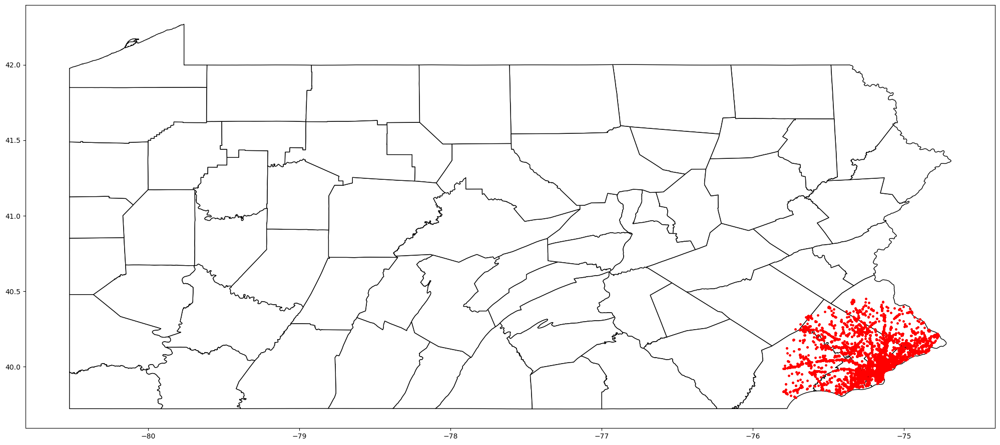

In [30]:
base = county.plot(color='white', edgecolor='black',figsize=(25, 15))
gdf.plot(ax=base, marker='o', color='red', markersize=5);
#we make two plots in one: the base will be the map of the Penn state, the gdf the longitude and latitude of the
#restaurants. 

The restaurants found in the `yelp_academic-dataset_business.json` are located around 6 counties, Philadelphia, Delaware, Chester, Montgomery, Bucks and Berks. To be able to visualize them properly it is convenient to filter only by those counties and then represent the restaurants. 

In [31]:
counties_to_include = ['PHILADELPHIA', 'DELAWARE', 'CHESTER', 'MONTGOMERY', 'BUCKS', 'BERKS']
county_small = county[county['COUNTY_NAM'].isin(counties_to_include)]


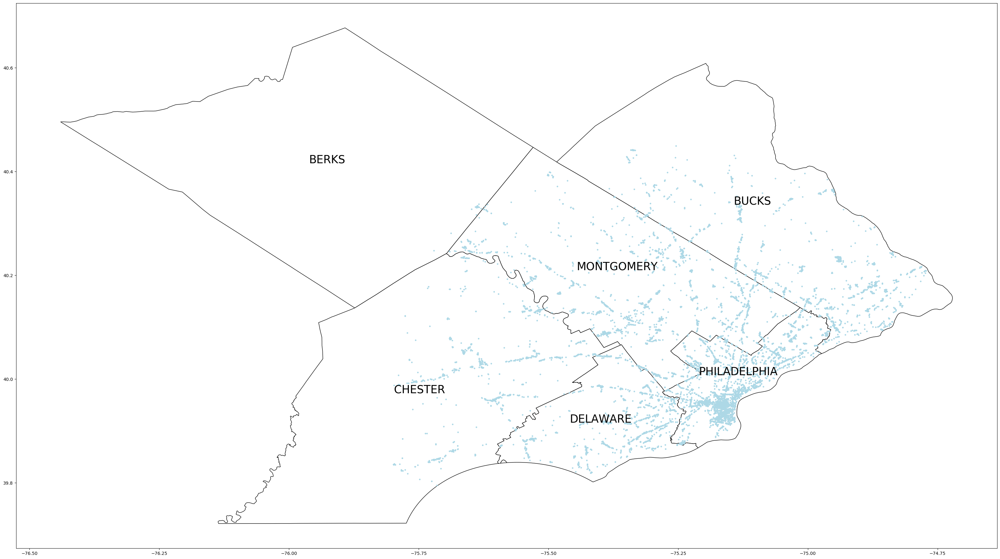

In [32]:
base = county_small.plot(color='white', edgecolor='black', figsize=(40, 40))
county_small.apply(lambda x: base.annotate(s=x.COUNTY_NAM, xy=x.geometry.centroid.coords[0], ha='center'
, fontsize=25),axis=1);


gdf.plot(ax=base, marker='o', color='lightblue', markersize=5, );

As we can see most of the restaurants are in Philadelphia, the largest city in Pennsylvania, Delaware has quite a few, but, as we move away from those two cities the restaurant registrations decrease considerably. 

In [33]:
restaurant_reviews_stars = restaurants[['city', 'review_count', 'stars']].groupby(['city'])\
.agg({'review_count': 'sum', 'stars': 'mean'}).sort_values(by='review_count', ascending=False)
restaurant_reviews_stars.head(5)

,review_count,stars
city,,
Philadelphia,530081,3.588262
New Orleans,409644,3.773411
Nashville,278302,3.592093
Tampa,256131,3.625100
Tucson,209660,3.486701


Looking at the number of reviews in Philadelphia we can see that, despite having a large number of reviews compared to the other cities, it seems to have few stars; the average stars in Philadelphia are 3.6. 

## 4. Reviewing the restaurants
For the Natural Language Processing algorithm, it is necessary to have a column with text. The text allows us to analyse both the words and the context and thus obtain information from the restaurant. The text allows us to infer whether a user's experience is good, bad or fair. We are now going to merge the database of Pennsylvania restaurants with their respective reviews, so that we have information about the restaurant and its ratings. 

In [34]:
review_json_path = "../data/raw/yelp_academic_dataset_review.json"

In [35]:
#we must reed this json by chunks because it is too large
size = 1000000
df_review = pd.read_json(review_json_path, lines=True,
                      dtype={'review_id':str,'user_id':str,
                             'business_id':str,'stars':int,
                             'date':str,'text':str,'useful':int,
                             'funny':int,'cool':int},
                      chunksize=size)

In [36]:
chunk_list = []
for chunk_review in df_review:
    
    # Drop columns that aren't needed
    chunk_review = chunk_review.drop(['review_id','useful','funny','cool'], axis=1)
    
    # Renaming column name to avoid conflict with business overall star rating
    chunk_review = chunk_review.rename(columns={'stars': 'review_stars'})
    
    # Inner merge with edited business file so only reviews related to the business remain
    restaurant_reviews_pen = pd.merge(pen_restaurants, chunk_review, on='business_id', how='inner')
    # Show feedback on progress
    
    print(f"{restaurant_reviews_pen.shape[0]} out of {size:,} related reviews")
    chunk_list.append(restaurant_reviews_pen)

133040 out of 1,000,000 related reviews
132519 out of 1,000,000 related reviews
131415 out of 1,000,000 related reviews
128022 out of 1,000,000 related reviews
127016 out of 1,000,000 related reviews
124367 out of 1,000,000 related reviews
125605 out of 1,000,000 related reviews


In [37]:
restaurant_reviews_pen.shape

(125605, 34)

In [38]:
#analyzing text for reviews
restaurant_reviews_pen['text'] = restaurant_reviews_pen['text'].apply(lambda x: " ".join([Word(word)\
.lemmatize() for word in x.split()]))
#we want to analyze the text so we need to make it an object

restaurant_reviews_pen['text'].head()

0    I don't know what's wrong with the people who ...
1    I went here about a year ago with a friend. Th...
2    My boyfriend and I love it here. I will admit ...
3    My sister in law made a reservation here for S...
4    I must have walked by this place 150 time with...
Name: text, dtype: object

In [39]:
def preprocess(x):
    x = re.sub('[^a-z\s]', '', x.lower())                  
    x = [w for w in x.split() if w not in set(stopwords)]  
    return ' '.join(x)
#we need all the words to be trated in the same way

'''
    Takes in a string of text, then performs the following:
    1. Performs case normalization
    2. Remove all punctuation
    3. Remove all stopwords
    4. Return the cleaned text as a list of words
    '''

# let's find out which stopwords need to be removed. We'll use english stopwords.
i = nltk.corpus.stopwords.words('english')
# punctuations to remove
j = list(string.punctuation)
# finally let's combine all of these
stopwords = set(i).union(j)
restaurant_reviews_pen['text_clear'] = restaurant_reviews_pen['text'].apply(preprocess)

"""
-------------------------------------------------------------------
"""
#we'll define the sentiment depending on the text
#if the text is good the sentiment will be positive (bigger than 0)
#if the text is negative the entiment will be negative (smaller than 0)
def sentiment(x):
    sentiment = TextBlob(x)
    return sentiment.sentiment.polarity


restaurant_reviews_pen['senti_polarity'] = restaurant_reviews_pen['text_clear'].apply(sentiment)

"""
-------------------------------------------------------------------
"""

'\n-------------------------------------------------------------------\n'

In [40]:
spm = restaurant_reviews_pen\
.groupby(restaurant_reviews_pen.business_id)['senti_polarity'].mean().sort_values(ascending=True)

#In this context, "senti_polarity" refers to the polarity of the sentiment 
#expressed in a piece of text. Polarity in this case refers to the degree to which a 
#sentiment is positive or negative. A polarity value of 0 means that the sentiment is neutral, 
#a value greater than 0 means that the sentiment is positive, and a value less than 0 means that 
#the sentiment is negative.

#The code is using the TextBlob library to determine the sentiment of each review in the 'text_clear' 
#column of the restaurant_reviews_pen 
#dataframe and storing the polarity values in a new column called 'senti_polarity'.

In [41]:
spm = pd.DataFrame(spm)

In [42]:
spm.reset_index(inplace=True)

In [43]:
spm_pen = pd.merge(pen_restaurants, spm, how='inner', on='business_id')
spm_pen

,BusinessAcceptsCreditCards,RestaurantsPriceRange2,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,business_id,...,category_2,category_3,category_4,category_5,category_6,category_7,category_8,category_9,category_10,senti_polarity
0,False,2,NaN,NaN,NaN,NaN,17:30-23:0,17:30-23:0,16:0-21:0,Zjg5nixJ-sTr9B6tsDzClw,...,Restaurants,None,None,None,None,None,None,None,None,0.257791
1,True,1,0:0-0:0,11:0-19:0,0:0-16:0,11:0-20:0,11:0-20:0,11:0-20:0,11:0-18:0,QOMnxrPAMZqKZ7liT21CdQ,...,Sandwiches,Vegetarian,None,None,None,None,None,None,None,0.133093
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Y-UcxAJlx8exuOJARQ4VVQ,...,Restaurants,None,None,None,None,None,None,None,None,0.137574
3,True,2,12:0-21:30,NaN,12:0-21:30,12:0-21:30,12:0-22:30,12:0-22:30,12:0-21:30,AmbhpZW_Xc_9ngKgDqpbYw,...,Restaurants,Japanese,None,None,None,None,None,None,None,0.293050
4,True,1,10:0-0:0,10:0-0:0,10:0-0:0,10:0-0:0,10:0-0:0,10:0-0:0,10:0-0:0,X6_5_b4gVKo83VPn0FyONw,...,Bubble Tea,None,None,None,None,None,None,None,None,0.216024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2040,NaN,2,11:0-0:0,11:0-0:0,11:0-0:0,11:0-0:0,11:0-2:0,11:0-2:0,NaN,2dVJ7R-3JMmu2v4DJYtBbw,...,Cafes,Hotels,Bars,Hotels & Travel,Restaurants,Event Planning & Services,None,None,None,0.080090
2041,True,2,6:0-22:0,6:0-22:0,6:0-22:0,6:0-22:0,6:0-22:0,6:0-22:0,6:0-22:0,Wko0HNelt55ZIp3Dm3eD2g,...,Sandwiches,Restaurants,Food,Grocery,None,None,None,None,None,0.277500
2042,True,2,10:0-21:0,10:0-21:0,10:0-21:0,10:0-21:0,10:0-18:0,10:0-16:0,10:0-19:0,wVxXRFf10zTTAs11nr4xeA,...,Specialty Food,Food,Sandwiches,Italian,None,None,None,None,None,0.184634
2043,True,1,0:0-0:0,0:0-0:0,0:0-0:0,0:0-0:0,0:0-0:0,0:0-0:0,0:0-0:0,l9eLGG9ZKpLJzboZq-9LRQ,...,Sandwiches,Convenience Stores,Coffee & Tea,Food,None,None,None,None,None,0.194443


If we look at the histograms, from 3.5 stars onwards the sentimental polarity is almost always positive, i.e. a good experience is found from 3.5 stars onwards. In order to recommend a good restaurant to customers, regardless of the type, it is important to filter by a minimum number of stars, as people do not usually want to go to restaurants that have 1, 2 stars. 

In [44]:
# Sort the dataframe by the 'stars' column in descending order
sorted_df = spm_pen.sort_values('stars', ascending=False)

# Create the histogram using the sorted dataframe
fig = px.histogram(data_frame=sorted_df, x='senti_polarity', facet_col='stars', nbins=50)
fig.show()


In [45]:
# Create a list of the names you want to eliminate
names_to_eliminate = ['Holly Hill Health Foods', 'Township Line Beer & Cigars', 'Aston Beverage Outlet']

# Use the `loc` function to select rows where the 'name' column is not in the list of names to eliminate
spm_pen = spm_pen.loc[~spm_pen['name'].isin(names_to_eliminate)]

In [46]:
best_pen_restaurants = spm_pen[(spm_pen['senti_polarity']>0)&(spm_pen['stars']>3.5)]
#filter those resturants that have a senti polarity bigger than 0 and more than 3.5 stars

In [47]:
top_restaurants = best_pen_restaurants['business_id'].tolist()

Once we have filtered the restaurants we can recommend the best ones to our customers. In this case, when you want to search for a type of food or a restaurant in the state of Pennsylvania, all the restaurants shown will have a sentimental polarity greater than 0 and more than 3.5 stars assured. Furthermore, in the model conducted in this practice, only those restaurants that the model considers to be able to offer a TOP experience will be classified as such. 

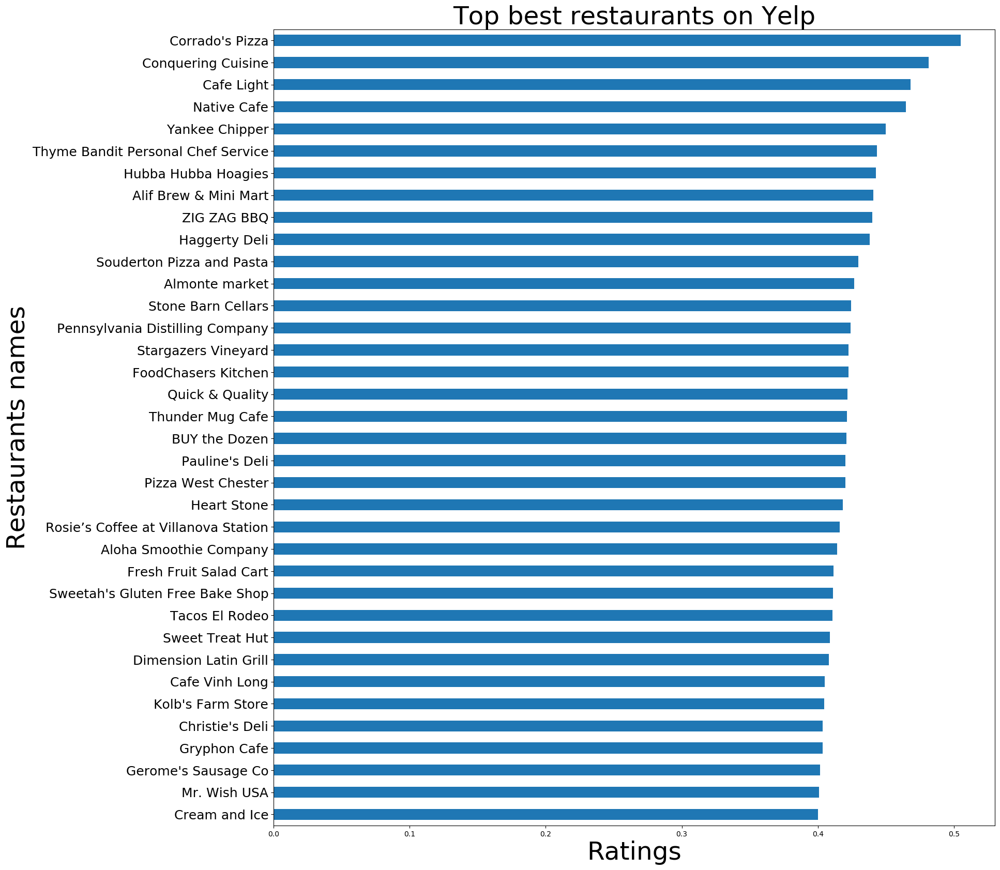

In [48]:
review_top = best_pen_restaurants.loc[best_pen_restaurants['business_id'].isin(top_restaurants)]
review_top = review_top.loc[review_top['senti_polarity'] > 0.4]

review_top_filtered = review_top.groupby(review_top.name)['senti_polarity'].mean()
review_top_filtered.sort_values(ascending=True).plot(kind='barh', figsize=(18, 20))

plt.yticks(fontsize=18)
plt.title('Top best restaurants on Yelp', fontsize=35)
plt.ylabel('Restaurants names', fontsize=35)
plt.xlabel('Ratings', fontsize=35)
plt.show()

The best restaurant in Pennsylvania found in the `Yelp_dataset` appears to be `Corrado's Pizza`, remember that the ratings are based on the column `senti_polarity`, only those restaurants that have a senti_polarity higher than 4 are chosen. 


Now we will look at the most used words in the restaurant reviews we have filtered. Remember that we have only kept the best restaurants in Pennsylvania, those with more than 3.5 stars. Which words are the most repeated in the reviews? The most repeated words are: 
- **amazing**
- **food**
- **truly**
- **good**
- **restaurant**
- **take**
- **time**

That these are the most repeated words, makes sense as we have been left with what are supposed to be the best restaurants. One important part of this is that it will help us understand how the model will make predictions suing words. The best restaurants seem to have good words, words that appear to be in a contenxt where the sentence means something good. 

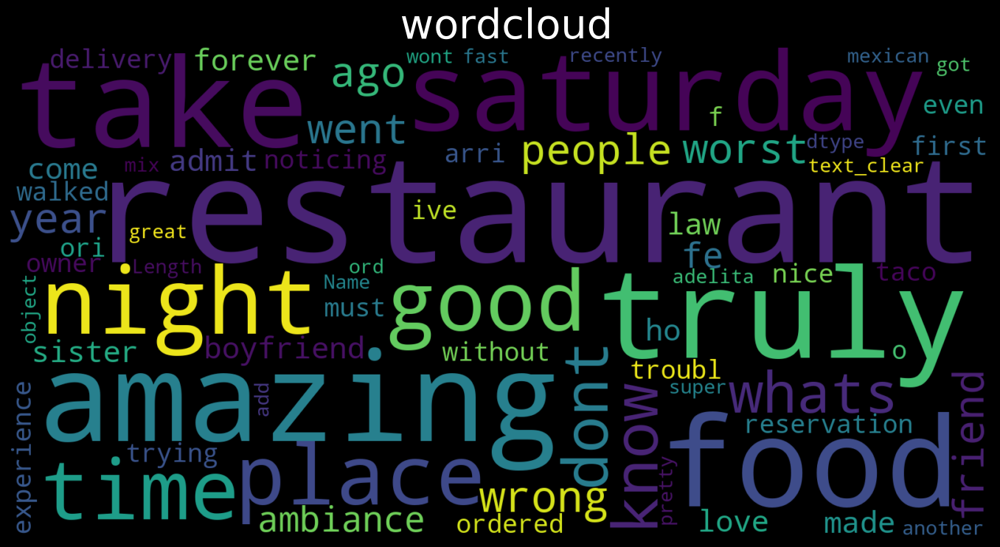

In [49]:
from wordcloud import WordCloud, STOPWORDS # this module is for making wordcloud in python

# difine wordcloud function from wordcloud library. set some parameteres for beatuful plotting
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
# generate word cloud using df_yelp_tip_top['text_clear']
wc.generate(str(restaurant_reviews_pen['text_clear']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title(" wordcloud", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

## 5. Reviewing the restaurants by type of food
Lets see the best restaurants but now lets order them by type of food to see what words are repeated in each review. 

In [50]:
#we filter by indian food
def has_indian_category(row):
    categories = [row['category_1'], row['category_2'], row['category_3'], row['category_4'], row['category_5'], 
                 row['category_6'], row['category_7'], row['category_8'], row['category_9'], row['category_10']]
    return any(category in indian for category in categories)

best_pen_restaurants_in = best_pen_restaurants[best_pen_restaurants.apply(has_indian_category, axis=1)]

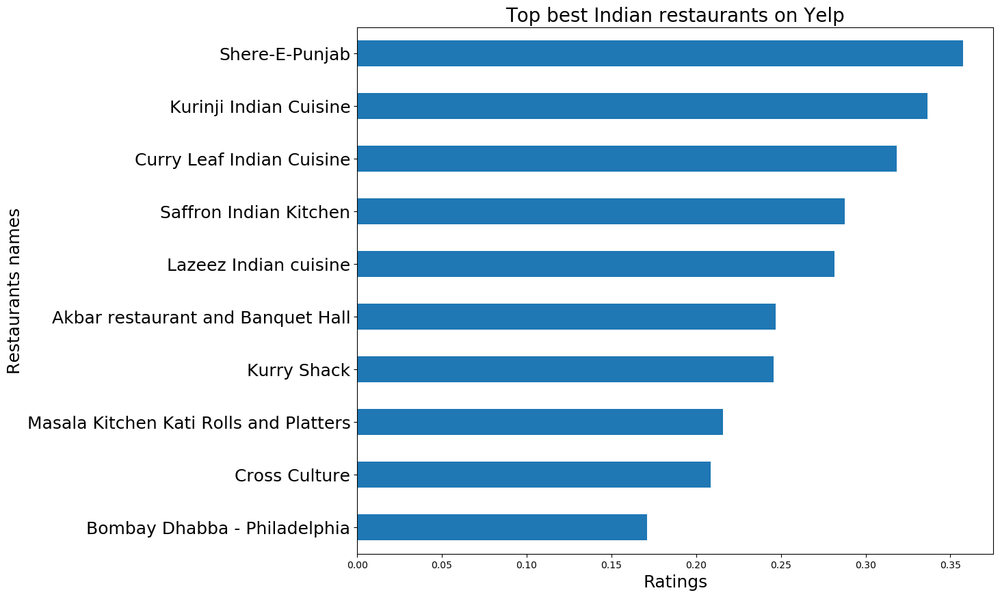

In [51]:
top_restaurants = best_pen_restaurants_in.business_id.value_counts().index[:20].tolist()
review_top = best_pen_restaurants_in.loc[best_pen_restaurants_in['business_id'].isin(top_restaurants)]
review_top.groupby(review_top.name)['senti_polarity'].mean().sort_values(ascending=True)\
.plot(kind='barh',figsize=(12, 10))

plt.yticks(fontsize=18)
plt.title('Top best Indian restaurants on Yelp',fontsize=20)
plt.ylabel('Restaurants names', fontsize=18)
plt.xlabel('Ratings', fontsize=18)
plt.show()

In [52]:
best_pen_restaurants_in = pd.merge(best_pen_restaurants_in, restaurant_reviews_pen, on='business_id')

It seems that the best Indian restaurant in Pennsylvania is called `Shere-E-Punjab`.
The words that are mostly repeated in the reviews are: 
- **indian**
- **new**
- **wonderful**
- **wa**
- **delish**
- **delicious**

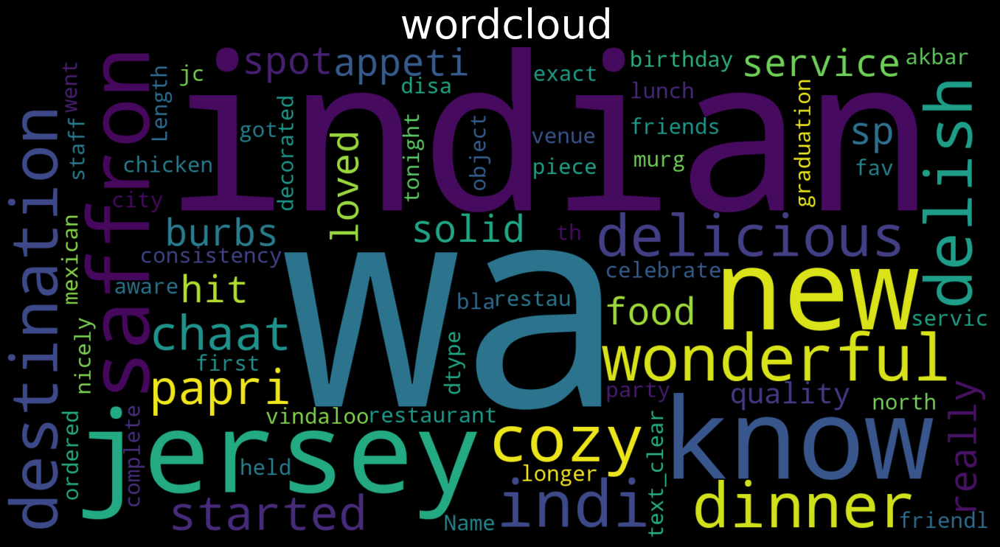

In [53]:
# difine wordcloud function from wordcloud library. set some parameteres for beatuful plotting
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
# generate word cloud using df_yelp_tip_top['text_clear']
wc.generate(str(best_pen_restaurants_in['text_clear']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title(" wordcloud", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

In [54]:
def has_italian_category(row):
    categories = [row['category_1'], row['category_2'], row['category_3'], row['category_4'], row['category_5'], 
                 row['category_6'], row['category_7'], row['category_8'], row['category_9'], row['category_10']]
    return any(category in italian for category in categories)

best_pen_restaurants_it = best_pen_restaurants[best_pen_restaurants.apply(has_italian_category, axis=1)]

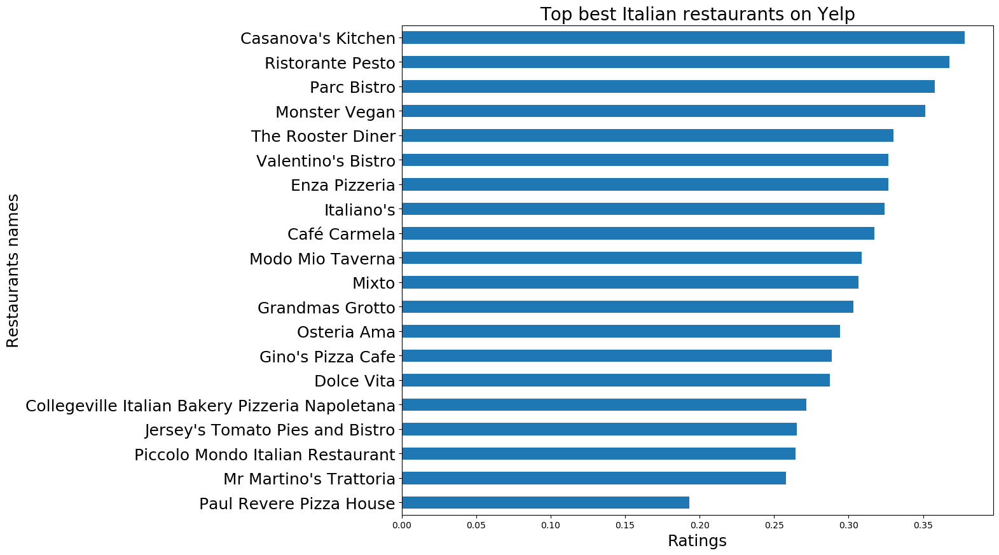

In [55]:
top_restaurants = best_pen_restaurants_it.business_id.value_counts().index[:20].tolist()
review_top = best_pen_restaurants_it.loc[best_pen_restaurants_it['business_id'].isin(top_restaurants)]
review_top.groupby(review_top.name)['senti_polarity'].mean().sort_values(ascending=True)\
.plot(kind='barh',figsize=(12, 10))

plt.yticks(fontsize=18)
plt.title('Top best Italian restaurants on Yelp',fontsize=20)
plt.ylabel('Restaurants names', fontsize=18)
plt.xlabel('Ratings', fontsize=18)
plt.show()

In [56]:
best_pen_restaurants_it = pd.merge(best_pen_restaurants_it, restaurant_reviews_pen, on='business_id')

The best italian restaurant in Pennsylvania is called `Casanova's Kitchen`. Here the words appear to be a little different from the other restaurants, we can find some important words such as: 
- **place**
- **worst**
- **food**
- **best**
- **come**

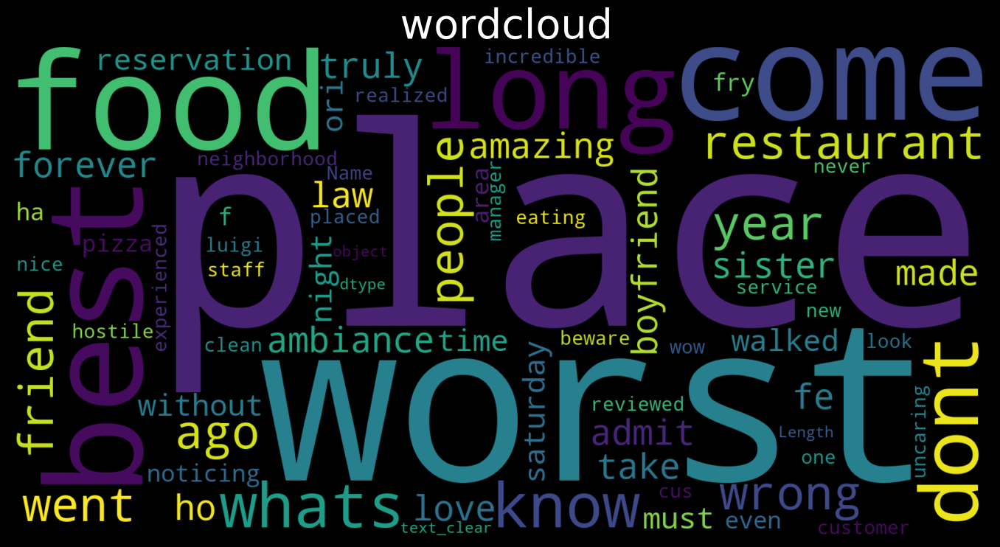

In [57]:
# difine wordcloud function from wordcloud library. set some parameteres for beatuful plotting
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
# generate word cloud using df_yelp_tip_top['text_clear']
wc.generate(str(best_pen_restaurants_it['text_clear']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title(" wordcloud", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

In [58]:
def has_chinese_category(row):
    categories = [row['category_1'], row['category_2'], row['category_3'], row['category_4'], row['category_5'], 
                 row['category_6'], row['category_7'], row['category_8'], row['category_9'], row['category_10']]
    return any(category in chinese for category in categories)

best_pen_restaurants_ch = best_pen_restaurants[best_pen_restaurants.apply(has_chinese_category, axis=1)]

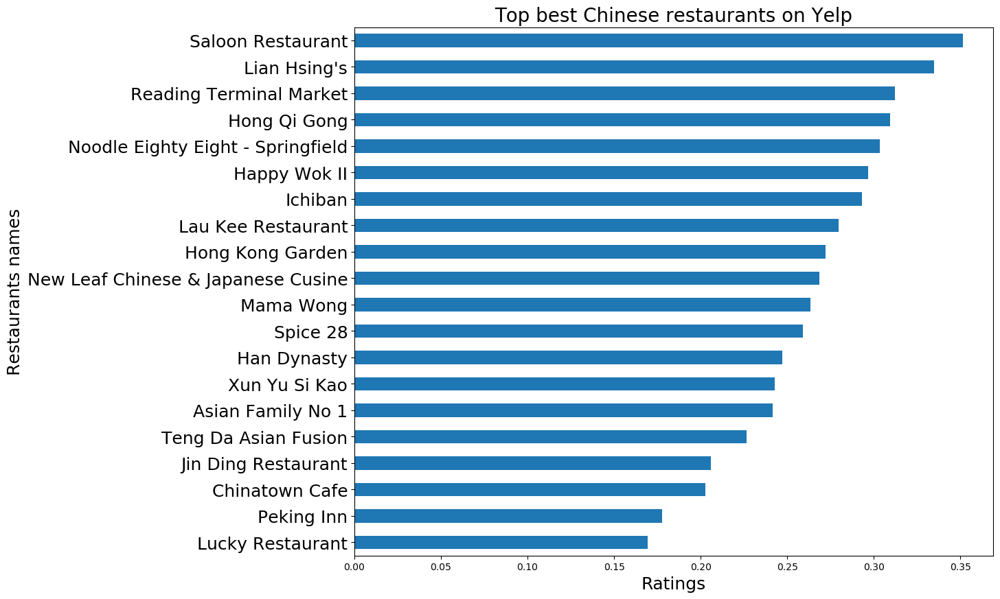

In [59]:
top_restaurants = best_pen_restaurants_ch.business_id.value_counts().index[:20].tolist()
review_top = best_pen_restaurants_ch.loc[best_pen_restaurants_ch['business_id'].isin(top_restaurants)]
review_top.groupby(review_top.name)['senti_polarity'].mean().sort_values(ascending=True)\
.plot(kind='barh',figsize=(12, 10))

plt.yticks(fontsize=18)
plt.title('Top best Chinese restaurants on Yelp',fontsize=20)
plt.ylabel('Restaurants names', fontsize=18)
plt.xlabel('Ratings', fontsize=18)
plt.show()

In [60]:
best_pen_restaurants_ch = pd.merge(best_pen_restaurants_ch, restaurant_reviews_pen, on='business_id')

The top chinese restaurant in Pennsylvania appears to be ``Saloon Restaurant``. What are the most repeated words for chinese restaurants with global good reviews? 
- **happy**
- **wok**
- **best**
- **great**
- **around**

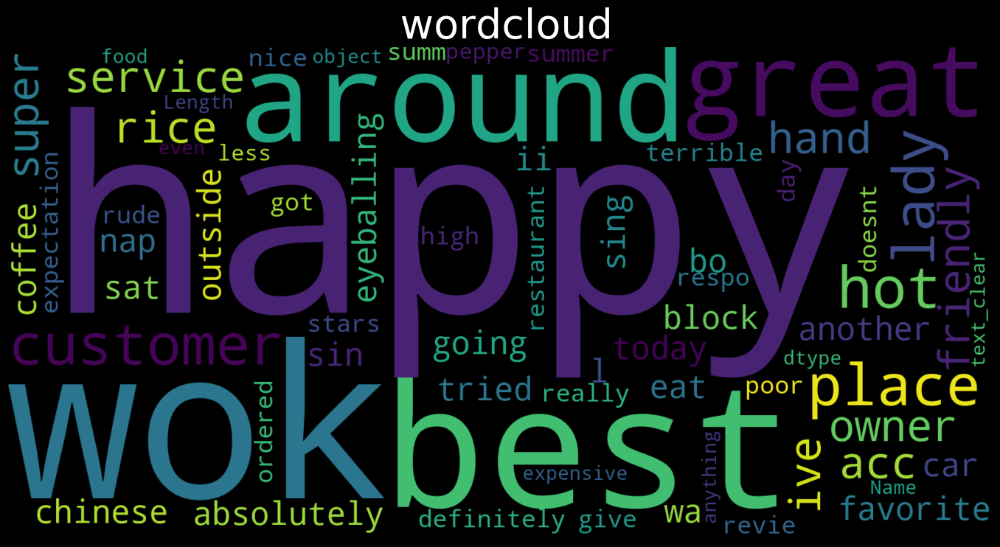

In [61]:
# difine wordcloud function from wordcloud library. set some parameteres for beatuful plotting
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
# generate word cloud using df_yelp_tip_top['text_clear']
wc.generate(str(best_pen_restaurants_ch['text_clear']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title(" wordcloud", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

In [62]:
def has_japanese_category(row):
    categories = [row['category_1'], row['category_2'], row['category_3'], row['category_4'], row['category_5'], 
                 row['category_6'], row['category_7'], row['category_8'], row['category_9'], row['category_10']]
    return any(category in japanese for category in categories)

best_pen_restaurants_jp = best_pen_restaurants[best_pen_restaurants.apply(has_japanese_category, axis=1)]

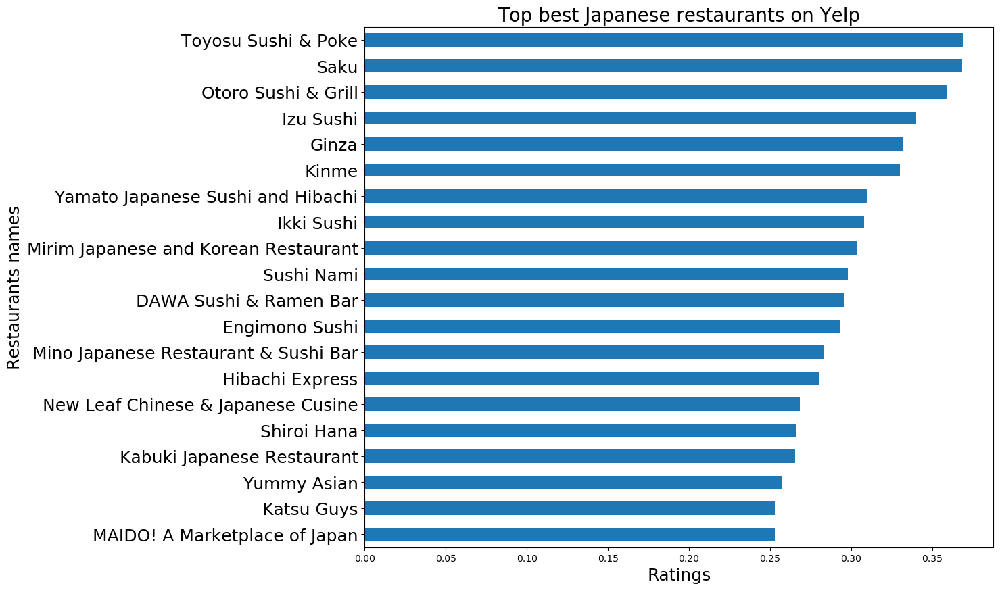

In [63]:
top_restaurants = best_pen_restaurants_jp.business_id.value_counts().index[:20].tolist()
review_top = best_pen_restaurants_jp.loc[best_pen_restaurants_jp['business_id'].isin(top_restaurants)]
review_top.groupby(review_top.name)['senti_polarity'].mean().sort_values(ascending=True)\
.plot(kind='barh',figsize=(12, 10))

plt.yticks(fontsize=18)
plt.title('Top best Japanese restaurants on Yelp',fontsize=20)
plt.ylabel('Restaurants names', fontsize=18)
plt.xlabel('Ratings', fontsize=18)
plt.show()

In [64]:
best_pen_restaurants_jp = pd.merge(best_pen_restaurants_jp, restaurant_reviews_pen, on='business_id')

The best Japanese restaurant in Pennsylvania appears to be ``Toyosu Sushi & Poke``. The words that are mostly repeated in the reviews are: 
- **food**
- **come**
- **oder**
- **place**
- **sushi**

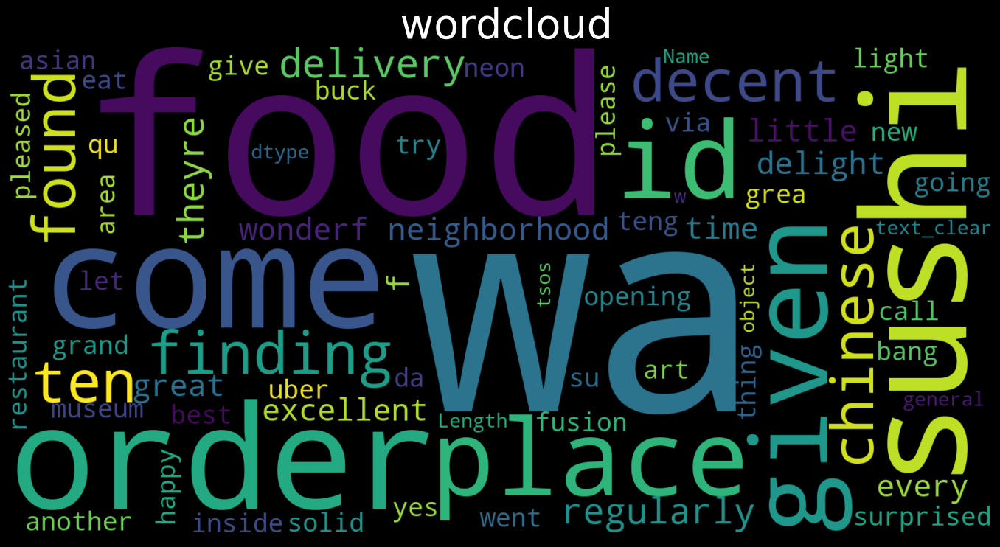

In [65]:
# difine wordcloud function from wordcloud library. set some parameteres for beatuful plotting
wc = WordCloud(width=1600, height=800, random_state=1, max_words=200000000)
# generate word cloud using df_yelp_tip_top['text_clear']
wc.generate(str(best_pen_restaurants_jp['text_clear']))
# declare our figure 
plt.figure(figsize=(20,10), facecolor='k')
# add title to the graph
plt.title(" wordcloud", fontsize=40,color='white')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=10)
# after lot of congiguration finally plot the graph
plt.show()

In [66]:
best_pen_restaurants['RestaurantsPriceRange2'] = pd.to_numeric(best_pen_restaurants['RestaurantsPriceRange2'])

In [67]:
# Create a mapping of the old values to the new values
mapping = {1.0: '$', 2.0: '$$', 3.0: '$$$', 4.0: '$$$$', 5.0: '$$$$$'}

# Use the 'map' function to apply the mapping to the 'RestaurantsPriceRange2' column
best_pen_restaurants['RestaurantsPriceRange2'] = best_pen_restaurants['RestaurantsPriceRange2'].map(mapping)


In [68]:
def print_restaurants(city):
  # Select all rows where the 'City' column is equal to the specified city
  restaurants = best_pen_restaurants[best_pen_restaurants['city'].isin([city])]

  # Replace null values in the 'City' column with the specified city
  restaurants['city'] = restaurants['city'].fillna(city)

  # Select the desired columns and print the resulting DataFrame
  columns_to_print = ['name', 'address', 'Monday', 'Tuesday','Wednesday', 'Thursday',
                     'Friday', 'Saturday', 'Sunday', 'RestaurantsPriceRange2', 'senti_polarity', 'city']
  return(pd.DataFrame(restaurants[columns_to_print]))


In [69]:
print_restaurants('Philadelphia')

,name,address,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday,RestaurantsPriceRange2,senti_polarity,city
0,Mr Martino's Trattoria,1646 E Passyunk Ave,NaN,NaN,NaN,NaN,17:30-23:0,17:30-23:0,16:0-21:0,$$,0.257791,Philadelphia
3,Engimono Sushi,1811 Fairmount Ave,12:0-21:30,NaN,12:0-21:30,12:0-21:30,12:0-22:30,12:0-22:30,12:0-21:30,$$,0.293050,Philadelphia
4,Vivi Bubble Tea,145 N 10th St,10:0-0:0,10:0-0:0,10:0-0:0,10:0-0:0,10:0-0:0,10:0-0:0,10:0-0:0,$,0.216024,Philadelphia
14,Cafe Couleur,323 Arch St,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.364756,Philadelphia
18,Rib Rack,2100 Tyson Ave,15:30-21:0,15:30-21:0,15:30-21:0,15:30-21:0,15:30-21:0,15:30-21:0,15:30-21:0,$$,0.197092,Philadelphia
...,...,...,...,...,...,...,...,...,...,...,...,...
2028,Spuntino Wood Fired Pizza,701 N 2nd St,NaN,12:0-21:0,12:0-21:0,12:0-21:0,12:0-21:0,12:0-21:0,NaN,$$,0.373297,Philadelphia
2032,Stina Pizzeria,1705 Snyder Ave,NaN,16:0-22:0,16:0-22:0,16:0-22:0,16:0-22:0,16:0-22:0,12:0-22:0,$$,0.339028,Philadelphia
2034,Flip-N-Pizza,1308 W Girard Ave,0:0-0:0,15:0-1:30,12:0-19:0,15:0-1:30,15:0-1:30,15:0-1:30,11:0-23:30,NaN,0.331615,Philadelphia
2036,Trader Joe's,2121 Market St,0:0-0:0,9:0-19:0,8:0-21:0,8:0-18:0,8:0-21:0,8:0-17:0,8:0-17:0,$$,0.210414,Philadelphia


## 6. Restaurant Recommendation System 
In order to make the search in the dataset more user-friendly, I have decided to create a restaurant search engine. 

To understand how it works, just choose the city of your choice in Pennsylvania, this is the part of the code where you should put the desired information ``restaurants = find_restaurants('Philadelphia', 'Chinese')``.

Change the city or the type of food or both, the type of food and the algorithm directly prints out the restaurants that match your search in a map.
My recomendation system only shows the best restaurants in each town, all of them have more than 3.5 stars and a ``senti_plarity`` bigger than 0. 

In [70]:
def find_restaurants(city, cuisine):
  # Select all rows where the 'City' column is equal to the specified city
  goodfood = best_pen_restaurants[best_pen_restaurants['city'].str.contains(city)]
  
  # Select rows where the specified cuisine is present in any of the 'category' columns
  goodcuisine = goodfood[(goodfood['category_1']).str.contains(cuisine) | (goodfood['category_2'])\
                         .str.contains(cuisine) | 
                         (goodfood['category_3']).str.contains(cuisine) | (goodfood['category_4'])\
                         .str.contains(cuisine) | 
                         (goodfood['category_5']).str.contains(cuisine) | (goodfood['category_6'])\
                         .str.contains(cuisine) | 
                         (goodfood['category_7']).str.contains(cuisine) | (goodfood['category_8'])\
                         .str.contains(cuisine) | 
                         (goodfood['category_9']).str.contains(cuisine) | (goodfood['category_10'])\
                         .str.contains(cuisine)]
  
  # Sort the resulting DataFrame by the 'spm' column in descending order and select the top 10 rows
  final = goodcuisine[['name', 'address', 'Monday', 'Tuesday','Wednesday', 'Thursday', 
'Friday', 'Saturday', 'Sunday', 'RestaurantsPriceRange2', 'senti_polarity', 'longitude', 'latitude']]
  f1 = final.sort_values('senti_polarity', axis=0, ascending=False).head(10)



    
  # Return the resulting DataFrame
  return f1

In [71]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
from geopy.geocoders import Nominatim
import math

# Find the top 10 Japanese restaurants in Philadelphia
restaurants = find_restaurants('Philadelphia', 'Chinese')

# Create the map
m_1 = folium.Map(location=[39.9527237, -75.1635262], tiles='cartodbpositron', zoom_start=9)

# Add points to the map
mc = MarkerCluster()
for idx, row in restaurants.iterrows():
    if not math.isnan(row['longitude']) and not math.isnan(row['latitude']):
        mc.add_child(Marker([row['latitude'], row['longitude']], popup=row['name']))
m_1.add_child(mc)

# Add a title to the map
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Top Restaurants in Philadelphia</b></h3>
             '''
m_1.get_root().html.add_child(folium.Element(title_html))

# Display the map
m_1
